# Data science Tasks

# Unsupervissed Learning Algorithms

# Task-3 Data Analysis on Country Datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df =pd.read_csv('Country-data.csv')
df.head(5)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [49]:
df.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


In [3]:
#features scaling
features = ['child_mort','exports','health','imports','income','inflation','life_expec','total_fer','gdpp']
features

['child_mort',
 'exports',
 'health',
 'imports',
 'income',
 'inflation',
 'life_expec',
 'total_fer',
 'gdpp']

In [4]:
features_1 = ['income','gdpp']
features_2 = ['child_mort','exports','imports','inflation','life_expec']
features_3 = ['health','total_fer']

<AxesSubplot:>

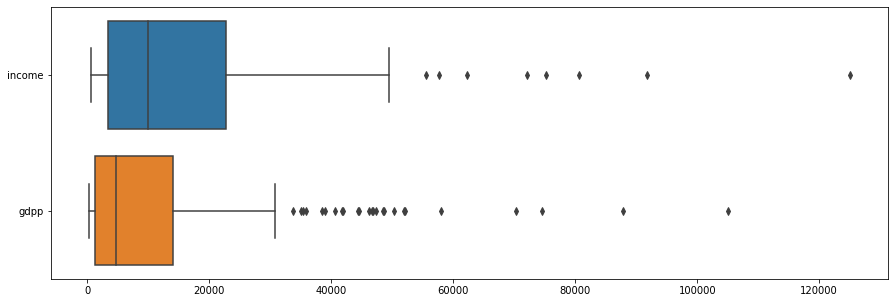

In [84]:
plt.figure(figsize =(15,5))
sns.boxplot(data =df[features_1],orient ='h')

<AxesSubplot:>

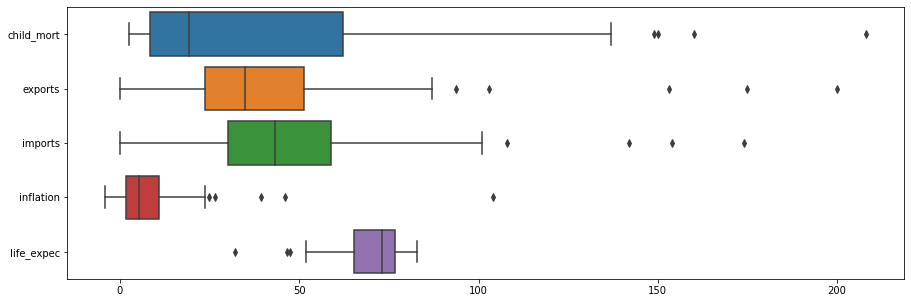

In [85]:
plt.figure(figsize =(15,5))
sns.boxplot(data = df[features_2],orient ='h')

<AxesSubplot:>

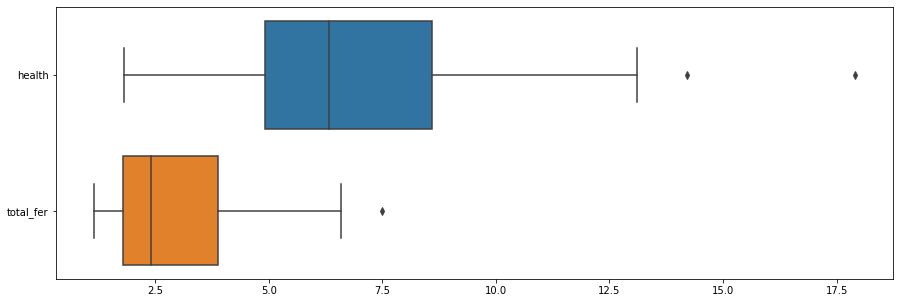

In [86]:
plt.figure(figsize =(15,5))
sns.boxplot(data =df[features_3],orient='h')

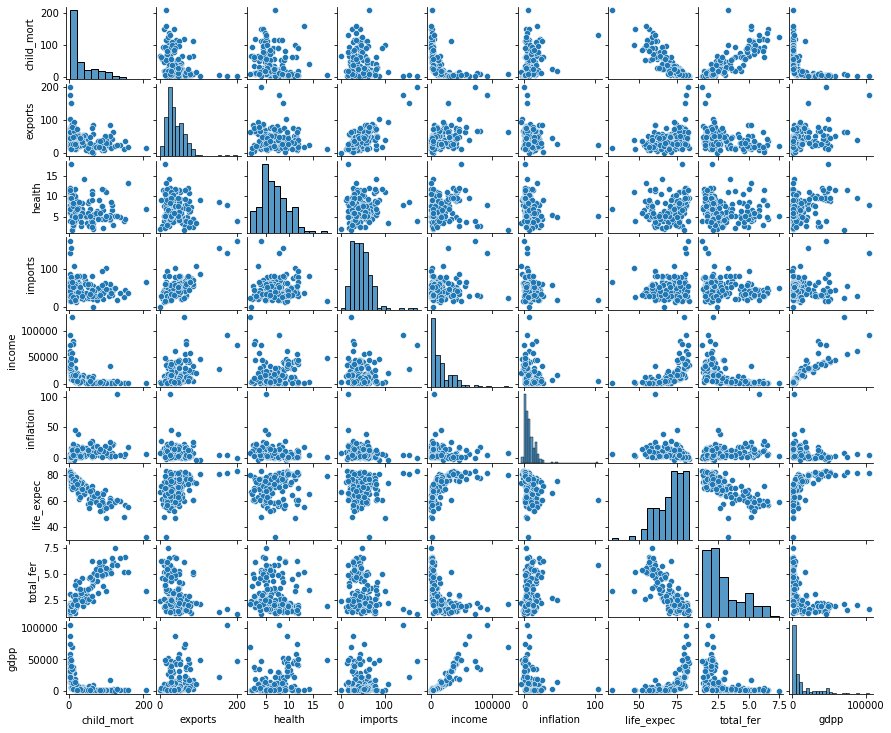

In [89]:
pp = sns.pairplot(df[features])
pp.fig.set_size_inches(12,10)

<AxesSubplot:>

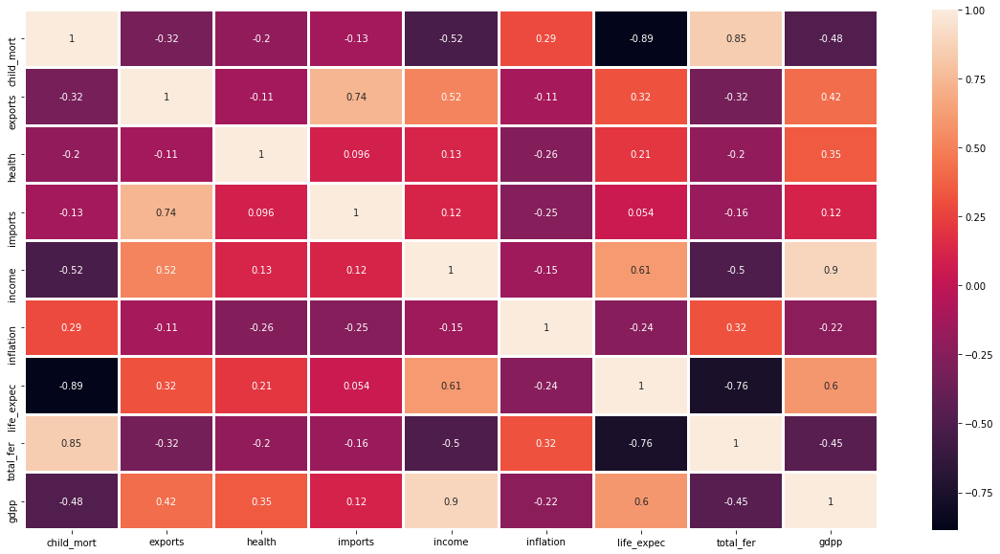

In [88]:
plt.figure(figsize = (20,10))
sns.heatmap(df[features].corr(),annot = True,linewidths = 2)

In [5]:
#features Engineering
data_drop = ['child_mort','gdpp','total_fer']
df.drop(data_drop,axis =1,inplace =True)

In [6]:
df['Trade_differnce'] = df['exports'] - df['imports']

In [7]:
features = [feat for feat in df.columns if feat not in ['country']]
print(features)

['exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'Trade_differnce']


In [8]:
#scaling of datasets
from sklearn.preprocessing import StandardScaler 
sts =StandardScaler()
scale_data = sts.fit_transform(df[features])
scale_data = pd.DataFrame(scale_data,columns = features)

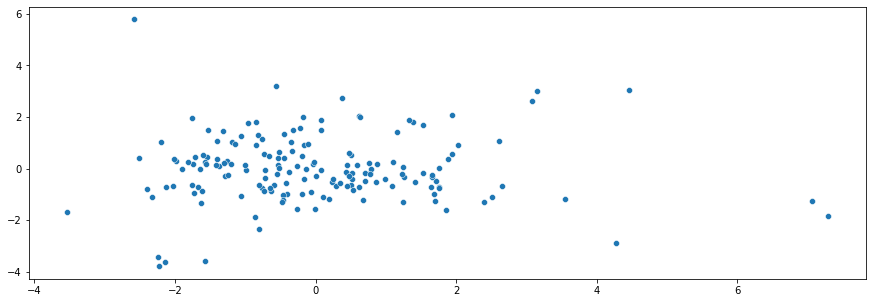

In [26]:
#for one cluster
plt.figure(figsize =(15,5))
projected_df = project_to_2d(scale_data, features, plot=True)

In [9]:
from sklearn.decomposition import PCA
def project_to_2d(df, features=features, plot=False, cluster=None):
    pca = PCA(n_components=2)
    projected = pca.fit_transform(df[features])
    if plot:
        if cluster is None:
            sns.scatterplot(
                x=projected[:, 0],
                y=projected[:, 1]
            )
        elif cluster is not None:
            num_clusters = df[cluster].nunique()
            sns.scatterplot(
                x=projected[:, 0],
                y=projected[:, 1],
                hue=df[cluster].values,
                palette=sns.color_palette("husl", num_clusters)
            )
    return projected

In [37]:
from sklearn.cluster import KMeans, AgglomerativeClustering ,DBSCAN

In [16]:
kmeans = KMeans(n_clusters =2,init ='k-means++',random_state =42)
kmeans.fit(scale_data[features])
scale_data['KMeans'] = kmeans.predict(scale_data[features])

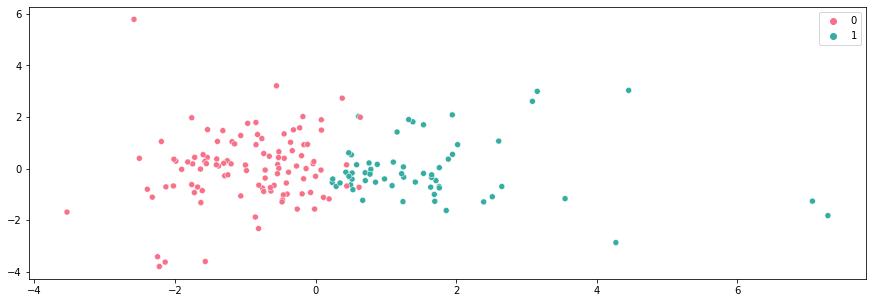

In [21]:
#for two cluster
plt.figure(figsize = (15,5))
projected_df = project_to_2d(scale_data, features, plot=True, cluster='KMeans')

In [22]:
pred = kmeans.predict(scale_data[features])
pred

array([0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0])

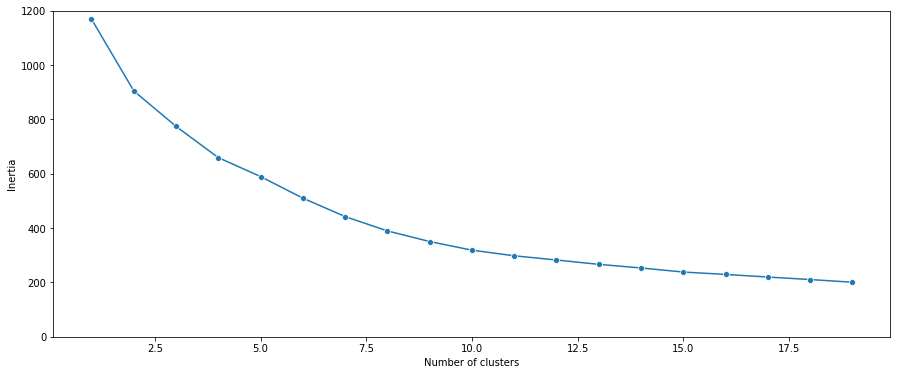

In [23]:
INERTIAS = []
for cluster in range(1,20):
    sts = KMeans(n_clusters = cluster, init='k-means++',n_jobs = -1, random_state=42)
    sts.fit(scale_data[features])
    INERTIAS.append(sts.inertia_)

inert_df = pd.DataFrame({'Num_Clusters':range(1,20), 'Inertia':INERTIAS})
plt.figure(figsize=(15,6))
sns.lineplot(data=inert_df, x="Num_Clusters", y="Inertia", marker='o')
plt.ylim(0, 1200)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia');

SO ACCORDING TO THE ELBOW DIAGRAM WE ARE FIND BEST FIT CLUSTER IS 3 FOR THIS DATASETS

In [135]:
model = KMeans(n_clusters=3, init='k-means++', random_state=42)
model.fit(scale_data[features])
scale_data['KMeans'] = model.predict(scale_data[features])
scale_data['KMeans']

0      0
1      0
2      0
3      0
4      2
      ..
162    0
163    0
164    0
165    0
166    0
Name: KMeans, Length: 167, dtype: int32

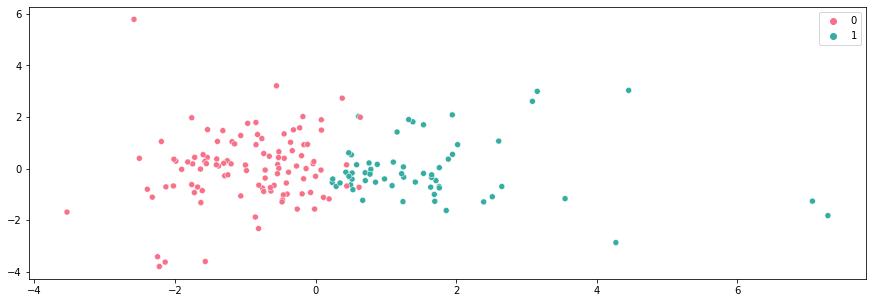

In [24]:
#for three clustering 
plt.figure(figsize =(15,5))
projected_df = project_to_2d(scale_data, features, plot=True, cluster='KMeans')

In [39]:
#Hierachy clustering
import scipy.cluster.hierarchy as shc

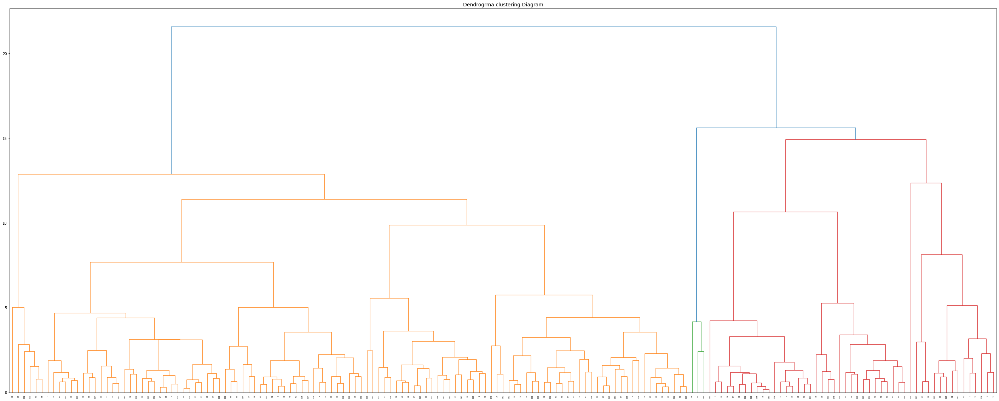

In [53]:
plt.figure(figsize=(50, 20))
plt.title('Dendrogrma clustering Diagram',fontsize =14)
hca = shc.dendrogram(shc.linkage(scale_data[features], method='ward'))

In [45]:
#Agglomerative Clustering Hierarchy
model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
model.fit(scale_data[features])
scale_data['Agglomerative_H'] = model.labels_

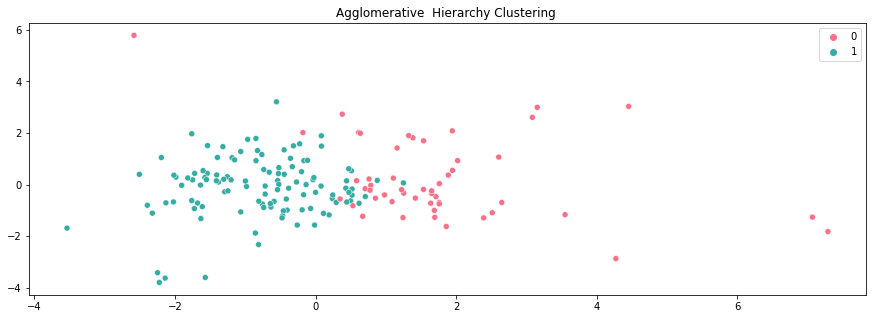

In [50]:
plt.figure(figsize=(15,5))
plt.title('Agglomerative  Hierarchy Clustering ')
projected_df = project_to_2d(scale_data, features, plot=True, cluster='Agglomerative_H')

In [56]:
#DBSCAN
dbs = DBSCAN(eps=1, min_samples=5)
dbs.fit(scale_data[features])
scale_data['DBSCAN'] = dbs.labels_

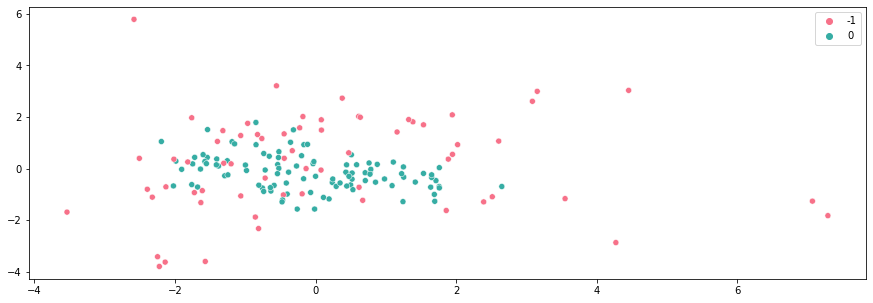

In [59]:
plt.figure(figsize =(15,5))
projected_df = project_to_2d(scale_data, features, plot=True, cluster='DBSCAN')

OVER TASK-3 

# Data Science Task

# Task -4 Credit card fraud prediction using clustering Algorithms

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline

In [2]:
df = pd.read_csv('creditcard.csv')
df.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [4]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.165980e-15,3.416908e-16,-1.373150e-15,2.086869e-15,9.604066e-16,1.490107e-15,-5.556467e-16,1.177556e-16,-2.406455e-15,...,1.656562e-16,-3.444850e-16,2.578648e-16,4.471968e-15,5.340915e-16,1.687098e-15,-3.666453e-16,-1.220404e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
df = df.drop(['Time','Class'],axis = 1)
df

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,...,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,...,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,...,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,...,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00


<AxesSubplot:>

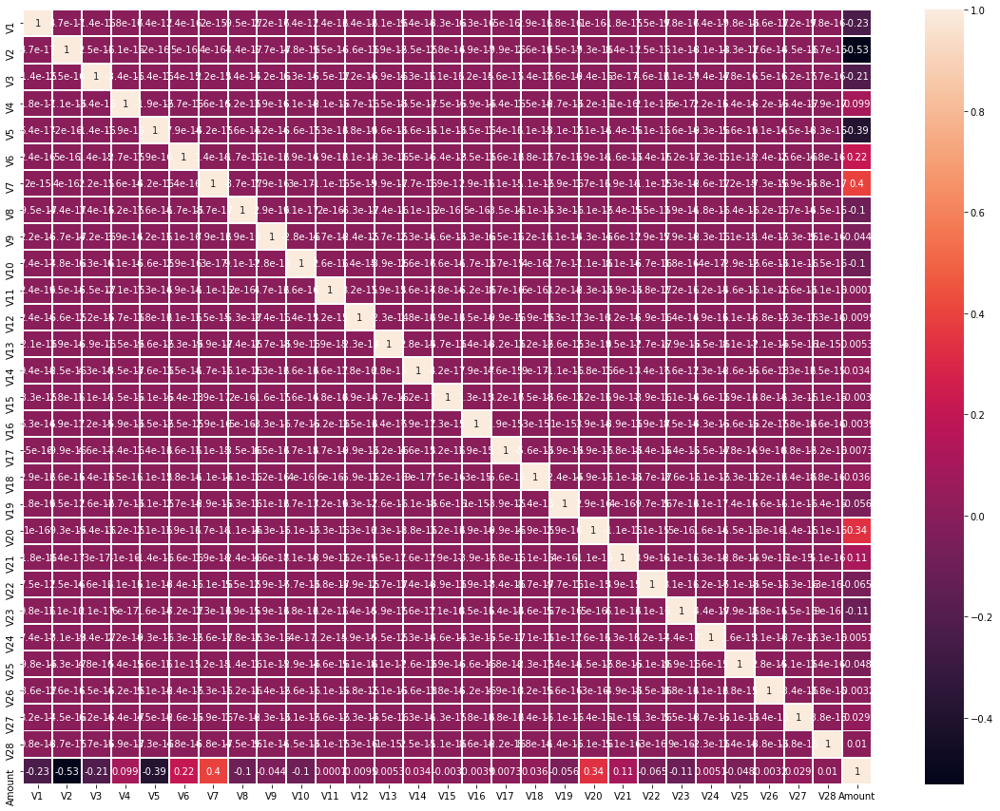

In [6]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot = True,linewidth =1)

In [7]:
df.isnull().sum().all()

False

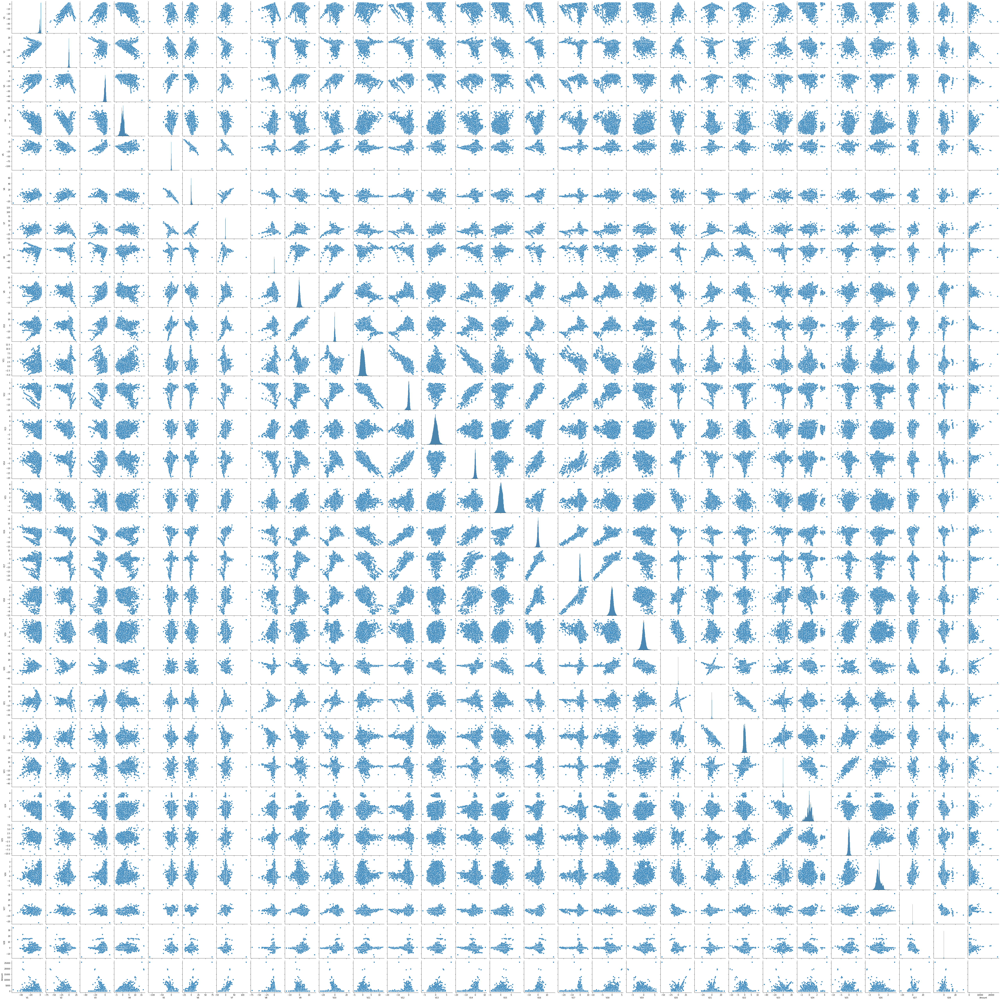

In [41]:
sns.pairplot(df)

In [10]:
df_loc = df.loc[:400:,['V11','V15']]
scaler_df = (df_loc - np.mean(df_loc))/np.std(df_loc)
df2 = scaler_df
df2

,V11,V15
0,-0.666871,1.310313
1,1.568532,0.437042
2,0.547854,2.230853
3,-0.331082,-0.891793
4,-0.947022,-0.045875
...,...,...
396,0.302214,0.644037
397,0.122992,-0.398124
398,-1.678608,-0.394832
399,1.161134,0.613461


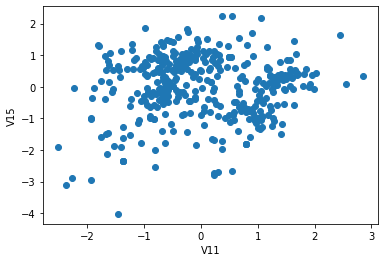

In [11]:
plt.scatter(df2.V11,df2.V15)
plt.xlabel('V11')
plt.ylabel('V15')
plt.show()

In [24]:
from sklearn.cluster import KMeans
wcss =[]
for k in range(1,15):
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(df2)
    wcss.append(kmeans.inertia_)

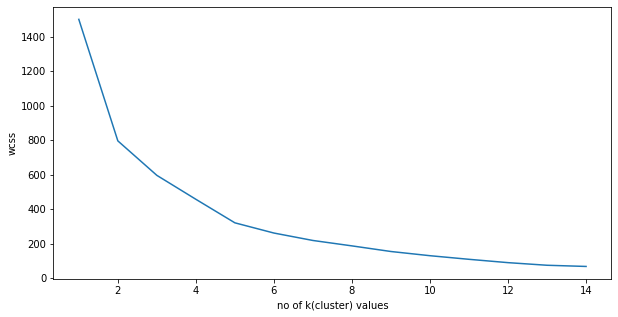

In [25]:
plt.figure(figsize =(10,5))
plt.plot(range(1,15),wcss)
plt.xlabel('no of k(cluster) values')
plt.ylabel('wcss')
plt.show()

SO ACCORDING TO THE ELBOW DIAGRAM WE ARE FIND BEST FIT CLUSTER IS 5 FOR THIS DATASETS

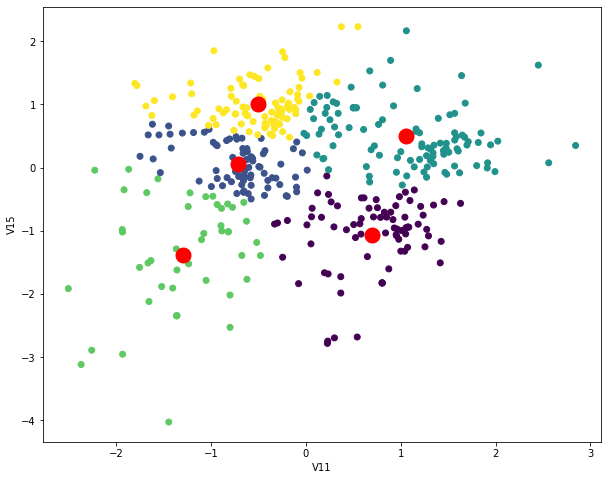

In [40]:
kmeans2 = KMeans(n_clusters = 5)

clusters =kmeans2.fit_predict(df2)

df2['label'] =clusters

plt.figure(figsize = (10,8))

plt.scatter(df2.V11, df2.V15, c = df2.label,)

plt.scatter(kmeans2.cluster_centers_[:,0], kmeans2.cluster_centers_[:,1], color = 'red',linewidths =10)

plt.xlabel('V11')
plt.ylabel('V15')
plt.show()